# **EN3160 – Computer Vision**
## **Assignment 01: Intensity Transformations and Neighborhood Filtering**

**Name:** Saruka U.  
**Index Number:** 230585C  

Github : https://github.com/Saruka03/EN3160-Assignment-01

---

# Question 1 – Intensity Transformation

In [ ]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

breakpoints = np.array([[0, 0],[50, 50],[100, 150],[150, 255],[255, 255] ])

def intensity_transform(im, breakpoints):
    breakpoints = np.asarray(breakpoints, dtype=np.float32)
    breakpoints = breakpoints[np.argsort(breakpoints[:, 0])]
    output = np.zeros_like(im, dtype=np.float32)
    for i in range(len(breakpoints) - 1):
        x1, y1 = breakpoints[i]
        x2, y2 = breakpoints[i + 1]
        mask = (im >= x1) & (im <= x2)
        output[mask] = (y1 + (y2 - y1) / (x2 - x1) * (im[mask] - x1))
    output[im < breakpoints[0, 0]] = breakpoints[0, 1]
    output[im > breakpoints[-1, 0]] = breakpoints[-1, 1]
    output = np.clip(output, 0, 255).astype(np.uint8)
    return output


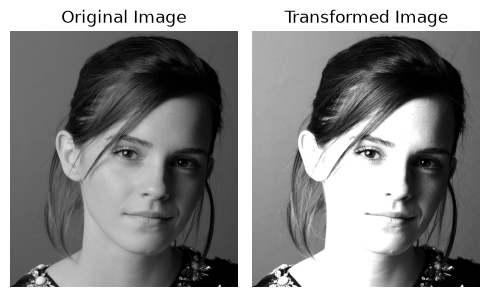

In [126]:
im = cv.imread("images/q1/fig1.jpg", cv.IMREAD_GRAYSCALE)
transformed = intensity_transform(im, breakpoints)
fig, ax = plt.subplots(1, 2, figsize=(5,10 ))
ax[0].imshow(im, cmap="gray", vmin=0, vmax=255)
ax[0].set_title("Original Image")
ax[0].axis("off")
ax[1].imshow(transformed, cmap="gray", vmin=0, vmax=255)
ax[1].set_title("Transformed Image")
ax[1].axis("off")
plt.tight_layout()
plt.show()

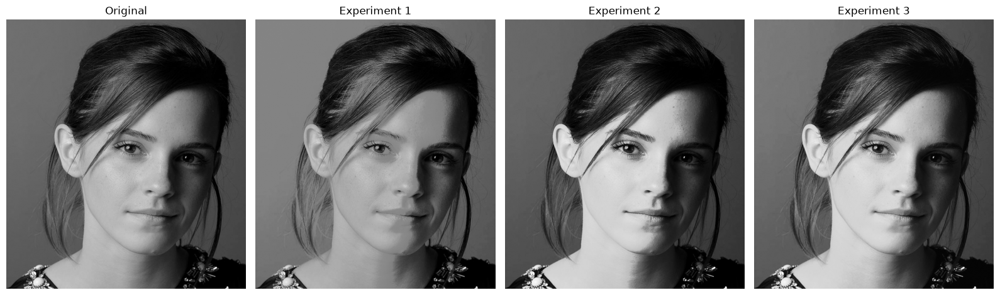

In [ ]:
breakpoints_1 = np.array([[0, 0],[50, 60],[100, 130],[150, 140],[255, 240]])
breakpoints_2 = np.array([[0, 0],[60, 45],[120, 115],[150, 190],[255, 255]])
breakpoints_3 = np.array([[0, 5],[60, 50],[120, 135],[180, 210],[255, 250]])
transformed_1 = intensity_transform(im, breakpoints_1)
transformed_2 = intensity_transform(im, breakpoints_2)
transformed_3 = intensity_transform(im, breakpoints_3)
fig, ax = plt.subplots(1, 4, figsize=(16, 5))
ax[0].imshow(im, cmap="gray", vmin=0, vmax=255)
ax[0].set_title("Original")
ax[0].axis("off")
ax[1].imshow(transformed_1, cmap="gray", vmin=0, vmax=255)
ax[1].set_title("Experiment 1")
ax[1].axis("off")
ax[2].imshow(transformed_2, cmap="gray", vmin=0, vmax=255)
ax[2].set_title("Experiment 2")
ax[2].axis("off")
ax[3].imshow(transformed_3, cmap="gray", vmin=0, vmax=255)
ax[3].set_title("Experiment 3")
ax[3].axis("off")
plt.tight_layout()
plt.show()

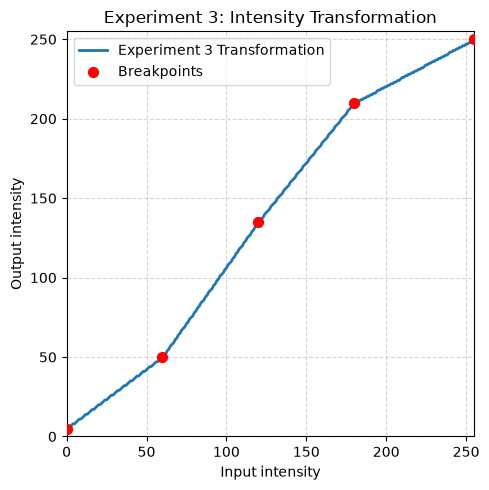

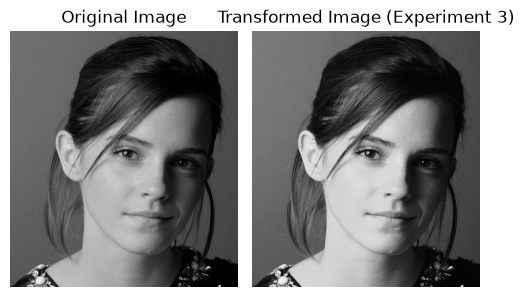

In [128]:
x = np.arange(256, dtype=np.uint8)
x_image = x.reshape(1, -1)
y = intensity_transform(x_image, breakpoints_3)[0]
plt.figure(figsize=(5, 5))
plt.plot(x, y, linewidth=2, label="Experiment 3 Transformation")
plt.scatter(breakpoints_3[:, 0],breakpoints_3[:, 1],color="red",s=50,zorder=3,label="Breakpoints")
plt.title("Experiment 3: Intensity Transformation")
plt.xlabel("Input intensity")
plt.ylabel("Output intensity")
plt.xlim(0, 255)
plt.ylim(0, 255)
plt.grid(True, linestyle="--", alpha=0.5)
plt.legend()
plt.tight_layout()
plt.show()

fig, ax = plt.subplots(1, 2, figsize=(5, 10))
ax[0].imshow(im, cmap="gray", vmin=0, vmax=255)
ax[0].set_title("Original Image")
ax[0].axis("off")
ax[1].imshow(transformed_3, cmap="gray", vmin=0, vmax=255)
ax[1].set_title("Transformed Image (Experiment 3)")
ax[1].axis("off")
plt.tight_layout()
plt.show()

### **Selection of the Best Transformation**

Three different sets of breakpoints were tested to obtain a visually pleasing intensity transformation. Experiment 1 provides a relatively mild enhancement, while Experiment 2 produces stronger contrast and brightness but causes some bright regions of the face to become over-enhanced. Experiment 3 provides a better balance between contrast enhancement and preservation of image details. Therefore, Experiment 3 was selected as the most visually pleasing transformation.

# Question 2 — Intensity Transformation for Brain Tissue

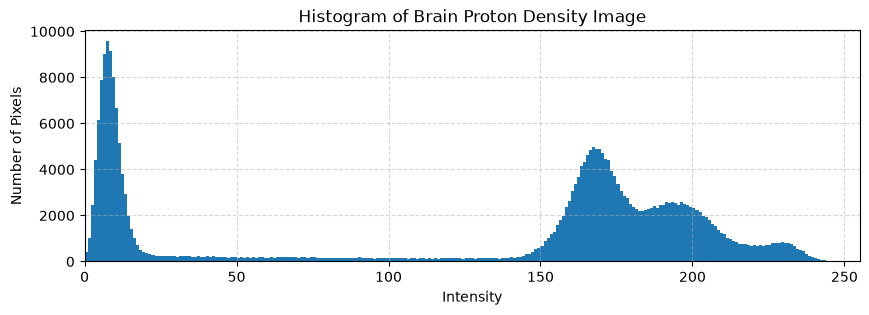

In [129]:
brain = cv.imread("images/q2/fig2.png   ", cv.IMREAD_GRAYSCALE)
plt.figure(figsize=(10, 3))
plt.hist(brain.ravel(), bins=256, range=(0, 256))
plt.title("Histogram of Brain Proton Density Image")
plt.xlabel("Intensity")
plt.ylabel("Number of Pixels")
plt.xlim(0, 255)
plt.grid(True, linestyle="--", alpha=0.5)
plt.show()

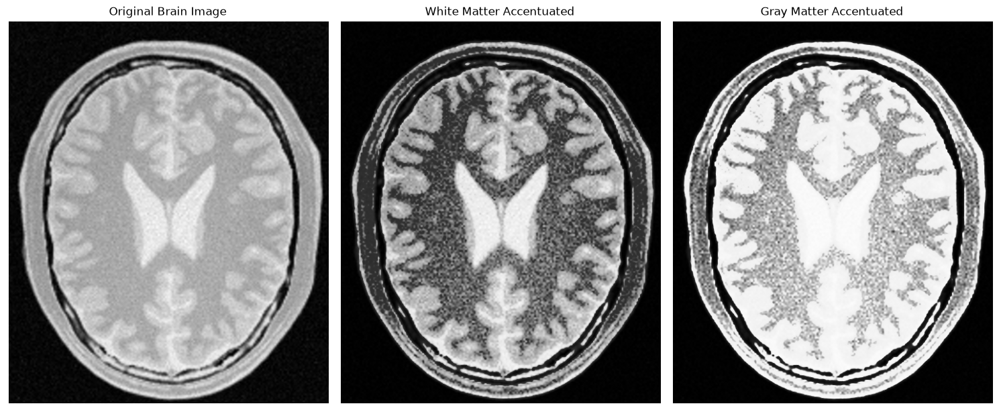

In [ ]:
breakpoints_wm = np.array([[0, 0],[160, 50],[180, 150],[220, 230],[255, 255]])
breakpoints_gm = np.array([[0, 0],[140, 40],[155, 120],[180, 240],[255, 255]])
brain_wm = intensity_transform(brain, breakpoints_wm)
brain_gm = intensity_transform(brain, breakpoints_gm)
fig, ax = plt.subplots(1, 3, figsize=(15, 6))
ax[0].imshow(brain, cmap="gray", vmin=0, vmax=255)
ax[0].set_title("Original Brain Image")
ax[0].axis("off")
ax[1].imshow(brain_wm, cmap="gray", vmin=0, vmax=255)
ax[1].set_title("White Matter Accentuated")
ax[1].axis("off")
ax[2].imshow(brain_gm, cmap="gray", vmin=0, vmax=255)
ax[2].set_title("Gray Matter Accentuated")
ax[2].axis("off")
plt.tight_layout()
plt.show()

### **Breakpoint Selection**

The breakpoint values were selected experimentally based on the intensity distribution of the brain proton-density image. The transformations were adjusted to increase the contrast of the intensity regions associated with the target tissue while keeping the background relatively dark. The final breakpoint sets were selected based on the visual separation and visibility of the respective tissue regions.

# Question 3 — Gamma Correction

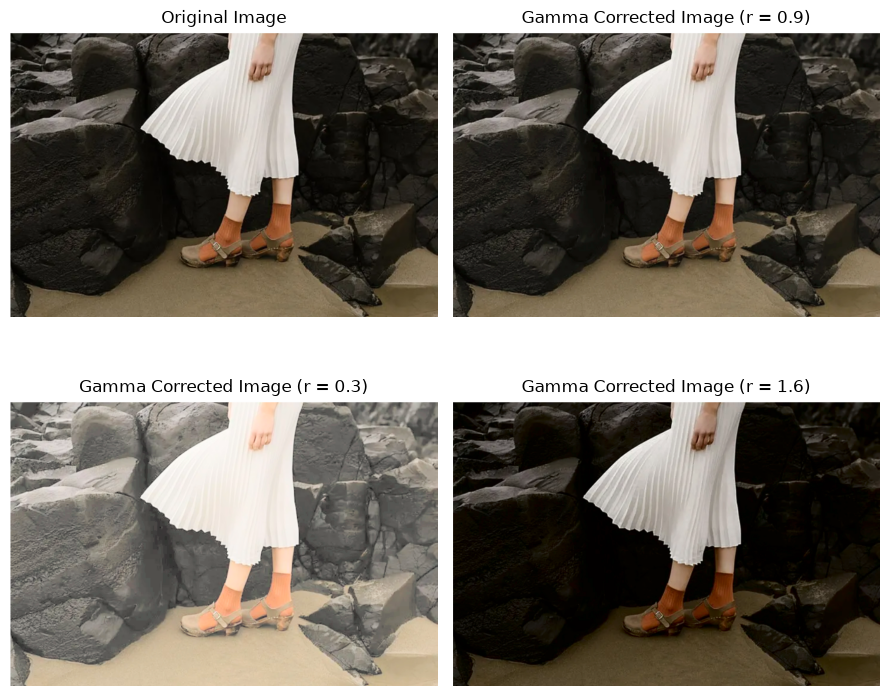

In [165]:
im_q3 = cv.imread("images/q3/fig3.png")
im_q3_rgb = cv.cvtColor(im_q3, cv.COLOR_BGR2RGB)
lab = cv.cvtColor(im_q3, cv.COLOR_BGR2LAB)
L, a, b = cv.split(lab)

def apply_gamma_correction(L, gamma):    
    L_normalized = L.astype(np.float32) / 255.0
    L_corrected = np.power(L_normalized, gamma)
    L_corrected = np.clip(L_corrected * 255, 0, 255).astype(np.uint8)
    lab_corrected = cv.merge([L_corrected,a,b])
    corrected_bgr = cv.cvtColor(lab_corrected, cv.COLOR_LAB2BGR)
    corrected_rgb = cv.cvtColor(corrected_bgr, cv.COLOR_BGR2RGB)
    return corrected_rgb

fig, ax = plt.subplots(2, 2, figsize=(9, 8))
ax[0,0].imshow(im_q3_rgb)
ax[0,0].set_title("Original Image")
ax[0,0].axis("off")
ax[1,0].imshow(apply_gamma_correction(L,gamma=0.3))
ax[1,0].set_title(f"Gamma Corrected Image (r = 0.3)")
ax[1,0].axis("off")
ax[0,1].imshow(apply_gamma_correction(L,gamma=0.9))
ax[0,1].set_title(f"Gamma Corrected Image (r = 0.9)")
ax[0,1].axis("off")
ax[1,1].imshow(apply_gamma_correction(L,gamma=1.6))
ax[1,1].set_title(f"Gamma Corrected Image (r = 1.6)")
ax[1,1].axis("off")
plt.tight_layout()
plt.show()

<Figure size 900x500 with 0 Axes>

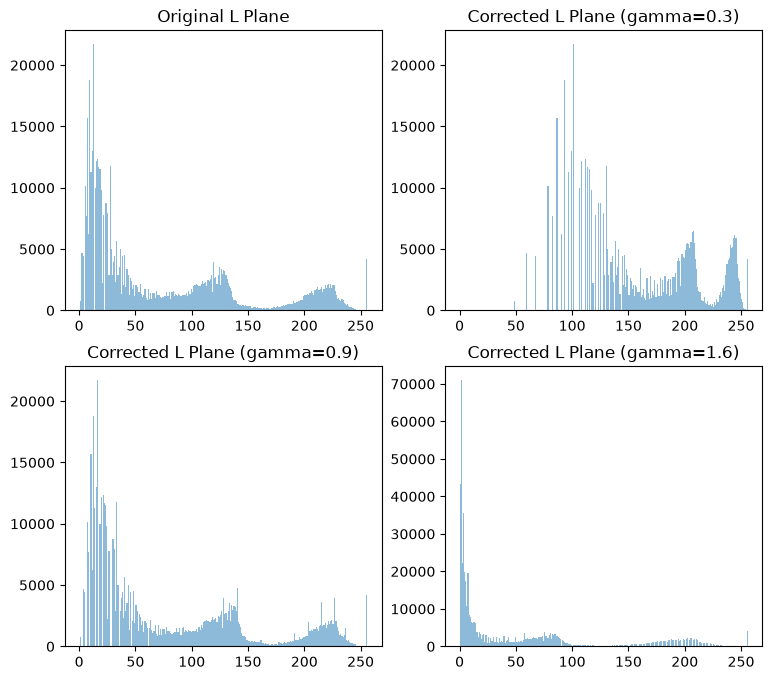

In [166]:
def gamma_correct_L(L, gamma):
    L_normalized = L.astype(np.float32) / 255.0
    L_corrected = np.power(L_normalized, gamma)
    return np.clip(L_corrected * 255, 0, 255).astype(np.uint8)
L_gamma03 = gamma_correct_L(L, 0.3)
L_gamma09 = gamma_correct_L(L, 0.9)
L_gamma16 = gamma_correct_L(L, 1.6)
plt.figure(figsize=(9, 5))
fig, ax = plt.subplots(2, 2, figsize=(9, 8))
ax[0,0].hist(L.ravel(),bins=256,range=(0, 256),alpha=0.5,label="Original L plane")
ax[0,1].hist(L_gamma03.ravel(),bins=256,range=(0, 256),alpha=0.5,label="Corrected L plane (gamma=0.3)")
ax[1,0].hist(L_gamma09.ravel(),bins=256,range=(0, 256),alpha=0.5,label="Corrected L plane (gamma=0.9)")
ax[1,1].hist(L_gamma16.ravel(),bins=256,range=(0, 256),alpha=0.5,label="Corrected L plane (gamma=1.6)")
ax[0,0].set_title("Original L Plane")
ax[0,1].set_title("Corrected L Plane (gamma=0.3)")
ax[1,0].set_title("Corrected L Plane (gamma=0.9)")
ax[1,1].set_title("Corrected L Plane (gamma=1.6)")
plt.show()

### **Observation**

Applying gamma correction only to the $L$ plane changes the lightness of the image while preserving the colour information represented by the $a$ and $b^*$ planes.

# Question 4 — Vibrance Enhancement
$$
f(x)=\min\left(x+a(128)
e^{-\frac{(x-128)^2}{2\sigma^2}},255\right)
$$
where \(x\) is the input saturation intensity, $a\in[0,1]$ controls the strength of the enhancement, and $\sigma=70$.

#### (a) Convert the image to HSV colour space

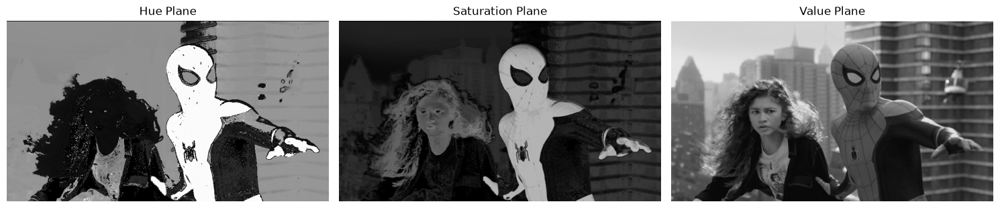

In [133]:
im_q4 = cv.imread("images/q4/fig4.png")
hsv = cv.cvtColor(im_q4, cv.COLOR_BGR2HSV)
H, S, V = cv.split(hsv)
fig, ax = plt.subplots(1, 3, figsize=(15, 5))
ax[0].imshow(H, cmap="gray")
ax[0].set_title("Hue Plane")
ax[0].axis("off")
ax[1].imshow(S, cmap="gray", vmin=0, vmax=255)
ax[1].set_title("Saturation Plane")
ax[1].axis("off")
ax[2].imshow(V, cmap="gray", vmin=0, vmax=255)
ax[2].set_title("Value Plane")
ax[2].axis("off")
plt.tight_layout()
plt.show()

#### (b) Apply the aforementioned intensity transformation to the saturation plane

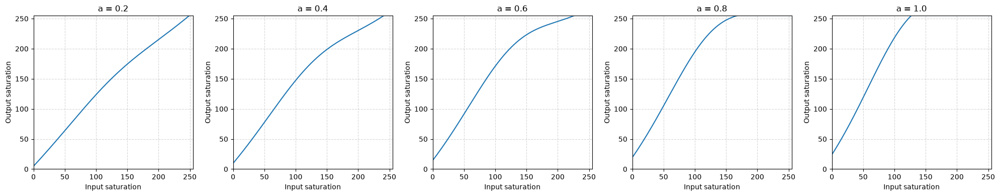

In [134]:
def vibrance_transform(x, a, sigma=70):
    x = np.asarray(x, dtype=np.float32)
    transformed = (x + a * 128 * np.exp(-((x - 128) ** 2) / (2 * sigma ** 2)))
    return np.clip(transformed, 0, 255)

a_values = [0.2, 0.4, 0.6, 0.8, 1.0]
x = np.arange(256)
fig, ax = plt.subplots(1, 5, figsize=(20, 4))
for i, a in enumerate(a_values):
    y = vibrance_transform(x, a)
    ax[i].plot(x, y)
    ax[i].set_title(f"a = {a}")
    ax[i].set_xlabel("Input saturation")
    ax[i].set_ylabel("Output saturation")
    ax[i].set_xlim(0, 255)
    ax[i].set_ylim(0, 255)
    ax[i].grid(True, linestyle="--", alpha=0.5)
plt.tight_layout()
plt.show()

#### (c) Adjust a to get a visually pleasing output. 

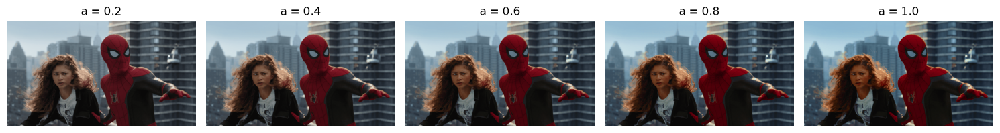

In [135]:
a_values = [0.2, 0.4, 0.6, 0.8, 1.0]
fig, ax = plt.subplots(1, 5, figsize=(15, 10))

for i, a in enumerate(a_values):
    S_new = vibrance_transform(S, a).astype(np.uint8)
    hsv_new = cv.merge([H, S_new, V])
    result_bgr = cv.cvtColor(hsv_new, cv.COLOR_HSV2BGR)
    result_rgb = cv.cvtColor(result_bgr, cv.COLOR_BGR2RGB)
    ax[i].imshow(result_rgb)
    ax[i].set_title(f"a = {a}")
    ax[i].axis("off")

plt.tight_layout()
plt.show()

#### (d) Recombine the three planes.

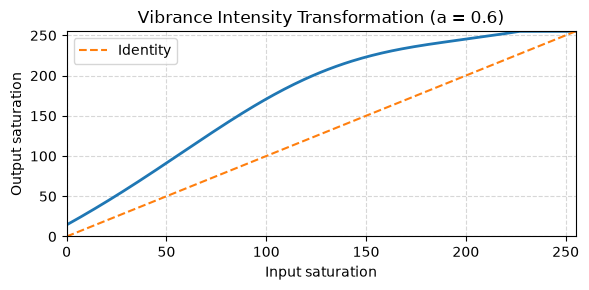

In [136]:
a = 0.6
S_new = vibrance_transform(S, a).astype(np.uint8)
hsv_enhanced = cv.merge([H, S_new, V])
enhanced_bgr = cv.cvtColor(hsv_enhanced, cv.COLOR_HSV2BGR)
enhanced_rgb = cv.cvtColor(enhanced_bgr, cv.COLOR_BGR2RGB)
x = np.arange(256)
y = vibrance_transform(x, a)
plt.figure(figsize=(6, 3))
plt.plot(x, y, linewidth=2)
plt.plot(x, x, linestyle="--", label="Identity")
plt.xlabel("Input saturation")
plt.ylabel("Output saturation")
plt.title(f"Vibrance Intensity Transformation (a = {a})")
plt.xlim(0, 255)
plt.ylim(0, 255)
plt.grid(True, linestyle="--", alpha=0.5)
plt.legend()
plt.tight_layout()
plt.show()

#### (e) Display the original image and vibrance-enhanced image

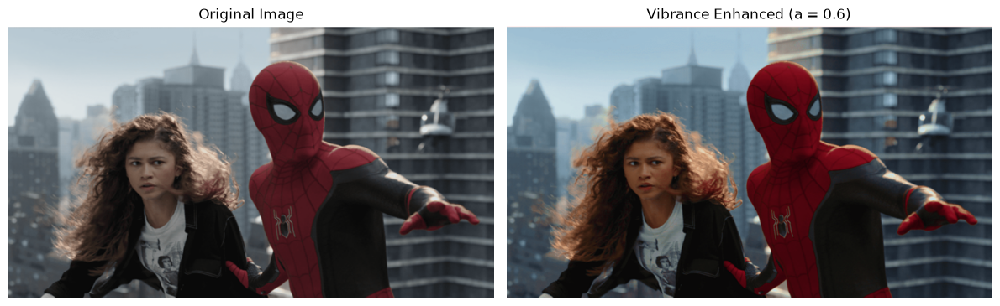

In [137]:
original_rgb = cv.cvtColor(im_q4, cv.COLOR_BGR2RGB)
fig, ax = plt.subplots(1, 2, figsize=(12, 5))
ax[0].imshow(original_rgb)
ax[0].set_title("Original Image")
ax[0].axis("off")
ax[1].imshow(enhanced_rgb)
ax[1].set_title(f"Vibrance Enhanced (a = {a})")
ax[1].axis("off")
plt.tight_layout()
plt.show()

### **Discussion**

The saturation plane was transformed using the specified vibrance intensity transformation while keeping the original hue and value planes unchanged. The parameter \(a\) controls the strength of the saturation enhancement. A suitable value of \(a\) was selected experimentally by comparing the resulting images. The selected value increases the vibrancy of the image while maintaining a natural appearance. The transformation mainly increases saturation around intermediate saturation values, producing more vivid colours without directly changing the hue or brightness.

# Question 5 — Histogram Equalization

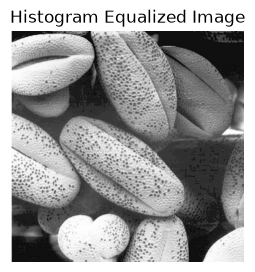

In [138]:
def histogram_equalization(im):
    hist = np.bincount(im.ravel(), minlength=256)
    pdf = hist / im.size
    cdf = np.cumsum(pdf)
    cdf_min = cdf[hist > 0][0]
    mapping = np.round((cdf - cdf_min) / (1 - cdf_min) * 255)
    mapping = np.clip(mapping, 0, 255).astype(np.uint8)
    equalized = mapping[im]
    return equalized

im_q5 = cv.imread("images/q5/fig5.png", cv.IMREAD_GRAYSCALE)
equalized_q5 = histogram_equalization(im_q5)
plt.figure(figsize=(5, 3))
plt.imshow(equalized_q5, cmap="gray", vmin=0, vmax=255)
plt.title("Histogram Equalized Image")
plt.axis("off")
plt.show()

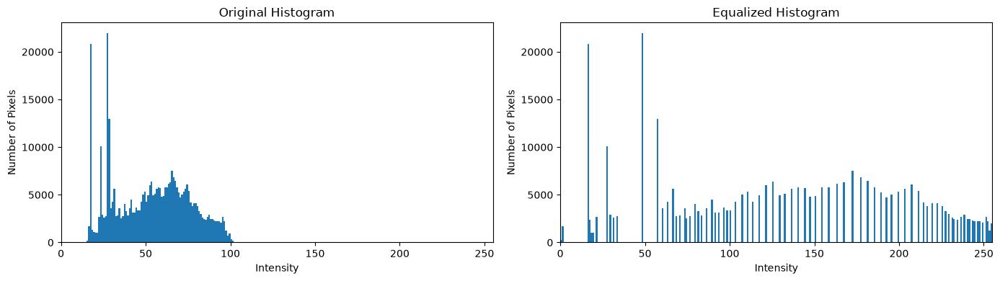

In [139]:
fig, ax = plt.subplots(1, 2, figsize=(14, 4))
ax[0].hist(im_q5.ravel(),bins=256,range=(0, 256))
ax[0].set_title("Original Histogram")
ax[0].set_xlabel("Intensity")
ax[0].set_ylabel("Number of Pixels")
ax[0].set_xlim(0, 255)
ax[1].hist(equalized_q5.ravel(),bins=256,range=(0, 256))
ax[1].set_title("Equalized Histogram")
ax[1].set_xlabel("Intensity")
ax[1].set_ylabel("Number of Pixels")
ax[1].set_xlim(0, 255)
plt.tight_layout()
plt.show()

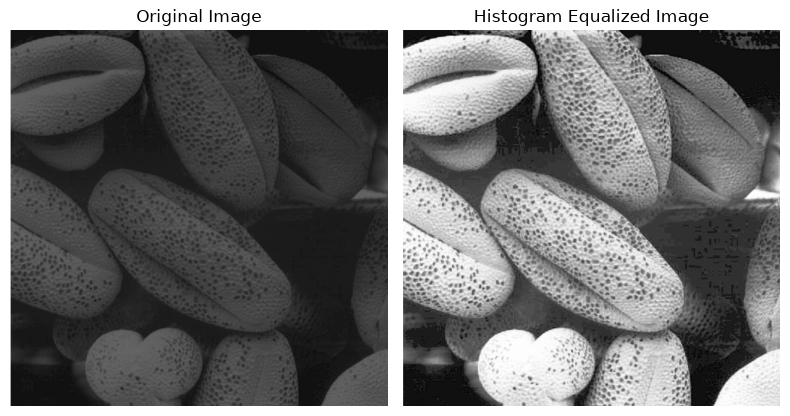

In [140]:
fig, ax = plt.subplots(1, 2, figsize=(8, 5))
ax[0].imshow(im_q5, cmap="gray", vmin=0, vmax=255)
ax[0].set_title("Original Image")
ax[0].axis("off")
ax[1].imshow(equalized_q5, cmap="gray", vmin=0, vmax=255)
ax[1].set_title("Histogram Equalized Image")
ax[1].axis("off")
plt.tight_layout()
plt.show()

### **Discussion**

The manually implemented histogram equalization redistributes the intensity values of the original image using the cumulative distribution function (CDF). Compared with the original image, the equalized image uses a wider range of intensities, resulting in improved contrast. The original and equalized histograms show how the distribution of pixel intensities changes after equalization. Unlike a simple intensity transformation with manually selected breakpoints, histogram equalization determines the intensity mapping from the image histogram itself.

# Question 6 — Histogram Equalization of the Foreground

#### (a)Open the image split it into hue, saturation, and values and display these planes in grayscale.

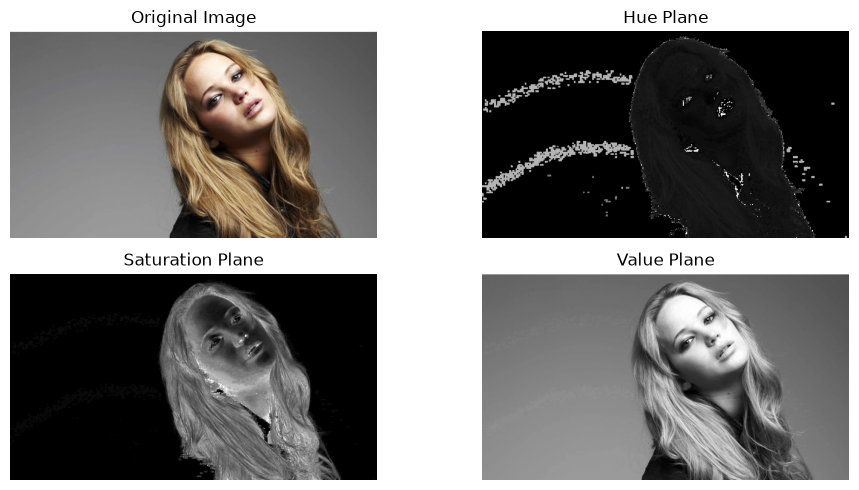

In [141]:
im_q6 = cv.imread("images/q6/fig6.png")
im_q6_rgb = cv.cvtColor(im_q6, cv.COLOR_BGR2RGB)
hsv_q6 = cv.cvtColor(im_q6, cv.COLOR_BGR2HSV)
H_q6, S_q6, V_q6 = cv.split(hsv_q6)
plt.figure(figsize=(10, 5))
plt.subplot(2, 2, 1)
plt.imshow(im_q6_rgb)
plt.title("Original Image")
plt.axis("off")
plt.subplot(2, 2, 2)
plt.imshow(H_q6, cmap="gray")
plt.title("Hue Plane")
plt.axis("off")
plt.subplot(2, 2, 3)
plt.imshow(S_q6, cmap="gray")
plt.title("Saturation Plane")
plt.axis("off")
plt.subplot(2, 2, 4)
plt.imshow(V_q6, cmap="gray")
plt.title("Value Plane")
plt.axis("off")
plt.tight_layout()
plt.show()

#### (b) Select the appropriate plane to threshold in extract the foreground mask.

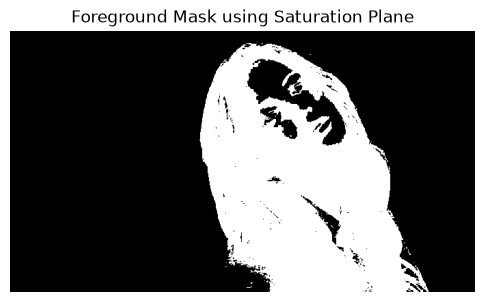

In [ ]:
S_q6 = hsv_q6[:, :, 1]
_, foreground_mask = cv.threshold(S_q6, 0, 255, cv.THRESH_BINARY + cv.THRESH_OTSU)
plt.figure(figsize=(6, 5))
plt.imshow(foreground_mask, cmap="gray")
plt.title("Foreground Mask using Saturation Plane")
plt.axis("off")
plt.show()

#### (c) Now obtain the foreground only using cv.bitwise_and and compute the histogram.

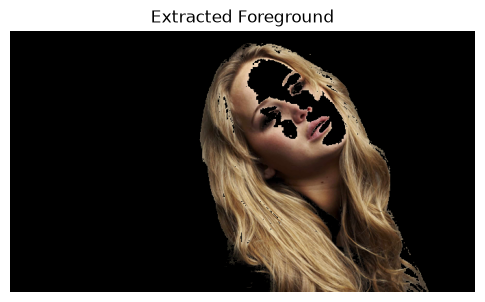

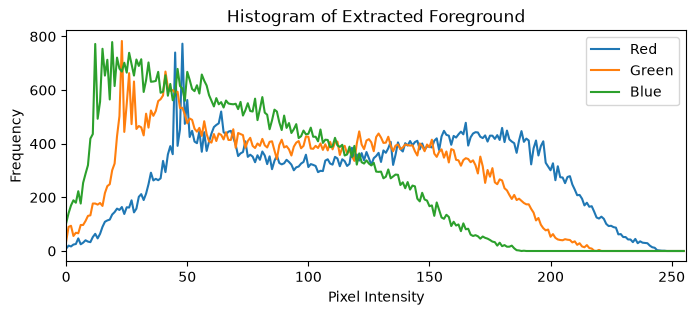

In [143]:
_, foreground_mask = cv.threshold(S_q6, 0, 255, cv.THRESH_BINARY + cv.THRESH_OTSU)
foreground_q6 = cv.bitwise_and(im_q6_rgb,im_q6_rgb,mask=foreground_mask)
plt.figure(figsize=(6, 5))
plt.imshow(foreground_q6)
plt.title("Extracted Foreground")
plt.axis("off")
plt.show()
hist_R = cv.calcHist([foreground_q6], [0], foreground_mask, [256], [0, 256])
hist_G = cv.calcHist([foreground_q6], [1], foreground_mask, [256], [0, 256])
hist_B = cv.calcHist([foreground_q6], [2], foreground_mask, [256], [0, 256])
plt.figure(figsize=(8, 3))
plt.plot(hist_R, label="Red")
plt.plot(hist_G, label="Green")
plt.plot(hist_B, label="Blue")
plt.title("Histogram of Extracted Foreground")
plt.xlabel("Pixel Intensity")
plt.ylabel("Frequency")
plt.legend()
plt.xlim([0, 256])
plt.show()

#### (d) Obtain the cumulative sum of the histogram using np.cumsum

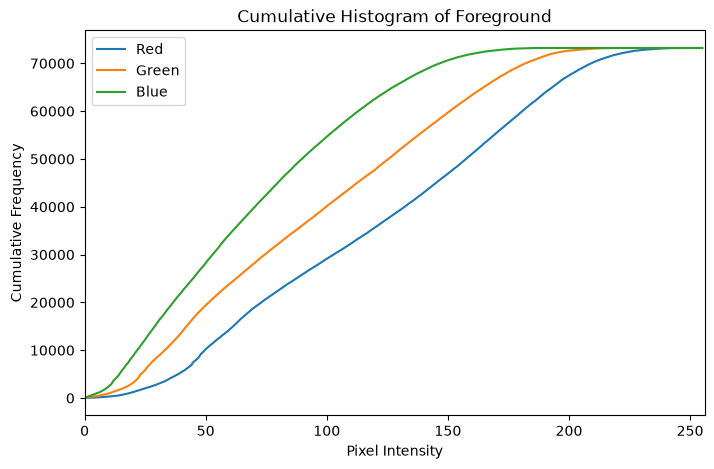

In [144]:
cdf_R = np.cumsum(hist_R)
cdf_G = np.cumsum(hist_G)
cdf_B = np.cumsum(hist_B)
plt.figure(figsize=(8, 5))
plt.plot(cdf_R, label="Red")
plt.plot(cdf_G, label="Green")
plt.plot(cdf_B, label="Blue")
plt.title("Cumulative Histogram of Foreground")
plt.xlabel("Pixel Intensity")
plt.ylabel("Cumulative Frequency")
plt.legend()
plt.xlim([0, 256])
plt.show()

#### (e) Use the formulas in slides to histogram - equalize the foreground

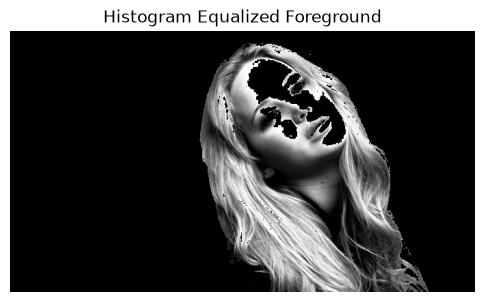

In [145]:
gray_foreground = cv.cvtColor(foreground_q6, cv.COLOR_RGB2GRAY)
hist = cv.calcHist([gray_foreground],[0],foreground_mask,[256],[0, 256]).flatten()
cdf = np.cumsum(hist)
cdf_min = cdf[cdf > 0][0]
N = np.sum(foreground_mask > 0)
L = 256
equalized_values = ((cdf - cdf_min) * (L - 1) / (N - cdf_min))
equalized_values = np.clip(equalized_values, 0, 255).astype(np.uint8)
equalized_foreground = np.zeros_like(gray_foreground)
equalized_foreground[foreground_mask > 0] = \
    equalized_values[gray_foreground[foreground_mask > 0]]
plt.figure(figsize=(6, 5))
plt.imshow(equalized_foreground, cmap="gray")
plt.title("Histogram Equalized Foreground")
plt.axis("off")
plt.show()

### **Discussion**

Unlike global histogram equalization, the proposed method equalizes only the foreground region identified by the HSV-based mask. The background pixels remain unchanged.

The foreground histogram is redistributed over a wider intensity range, improving the contrast of the foreground while avoiding unnecessary changes to the background. The quality of the result depends on the accuracy of the foreground mask; an inappropriate threshold may include background pixels or exclude parts of the foreground.

## Question 7 — Sobel Filtering

(a) Using the existing filter 2D to Sobel filter the image

In [ ]:
im_q7 = cv.imread("images/q7/fig7.png",cv.IMREAD_GRAYSCALE)
Gx = np.array([[-1, 0, 1],[-2, 0, 2],[-1, 0, 1]], dtype=np.float32)
Gy = np.array([[-1, -2, -1],[ 0,  0,  0],[ 1,  2,  1]], dtype=np.float32)
sobel_x = cv.filter2D(im_q7.astype(np.float32),-1,Gx)
sobel_y = cv.filter2D(im_q7.astype(np.float32),-1,Gy)
magnitude = np.sqrt(sobel_x**2 + sobel_y**2)
magnitude_display = cv.normalize(magnitude,None,0,255,cv.NORM_MINMAX).astype(np.uint8)

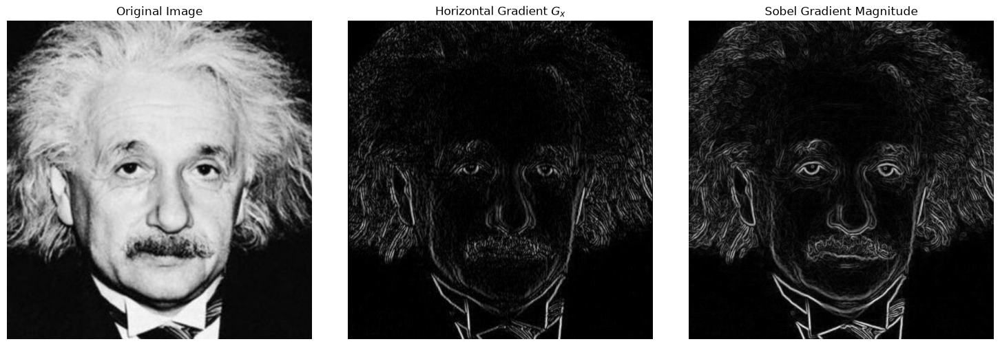

In [147]:
fig, ax = plt.subplots(1, 3, figsize=(15, 5))
ax[0].imshow(im_q7, cmap="gray")
ax[0].set_title("Original Image")
ax[0].axis("off")
ax[1].imshow(np.abs(sobel_x),cmap="gray")
ax[1].set_title("Horizontal Gradient $G_x$")
ax[1].axis("off")
ax[2].imshow(magnitude_display,cmap="gray")
ax[2].set_title("Sobel Gradient Magnitude")
ax[2].axis("off")
plt.tight_layout()
plt.show()

#### (b) Write your own code to Sobel filter the image.

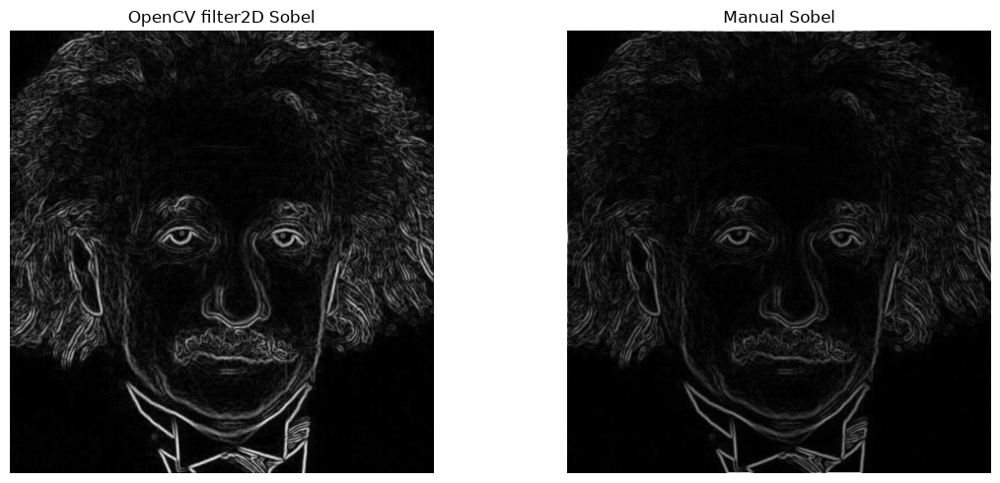

In [148]:
def manual_filter2d(im, kernel):
    im = im.astype(np.float32)
    kernel = kernel.astype(np.float32)
    kh, kw = kernel.shape
    pad_h = kh // 2
    pad_w = kw // 2
    padded = np.pad(im,((pad_h, pad_h), (pad_w, pad_w)),mode="constant")
    output = np.zeros_like(im, dtype=np.float32)
    kernel_flipped = np.flipud(np.fliplr(kernel))
    for i in range(im.shape[0]):
        for j in range(im.shape[1]):
            region = padded[i:i+kh,j:j+kw]
            output[i, j] = np.sum(region * kernel_flipped)
    return output

manual_x = manual_filter2d(im_q7,Gx)
manual_y = manual_filter2d(im_q7,Gy)
manual_magnitude = np.sqrt(manual_x**2 + manual_y**2)
manual_display = cv.normalize(manual_magnitude,None,0,255,cv.NORM_MINMAX).astype(np.uint8)

fig, ax = plt.subplots(1, 2, figsize=(12, 5))
ax[0].imshow(magnitude_display,cmap="gray")
ax[0].set_title("OpenCV filter2D Sobel")
ax[0].axis("off")
ax[1].imshow(manual_display,cmap="gray")
ax[1].set_title("Manual Sobel")
ax[1].axis("off")
plt.tight_layout()
plt.show()

In [149]:
difference = np.abs(magnitude - manual_magnitude)
print("Maximum absolute difference:",np.max(difference))
print("Mean absolute difference:",np.mean(difference))

Maximum absolute difference: 985.18066
Mean absolute difference: 1.2075155


#### (c) Separability of the Sobel Filter


In [150]:
smooth = np.array([1, 2, 1], dtype=np.float32)
derivative = np.array([-1, 0, 1], dtype=np.float32)
Gx_separable = np.outer(smooth,derivative)
Gy_separable = np.outer(derivative,smooth)

### **Discussion**
The Sobel operator detects image edges using horizontal, vertical, and combined gradient responses. The manual implementation closely matches OpenCV’s filter2D, confirming its correctness. Since Sobel kernels are separable, they can be implemented using two 1-D filters, reducing computational cost.

## Question 8 — Image Zooming and Interpolation

In [151]:
def nearest_neighbor_resize(im, scale):
    h, w = im.shape
    new_h = int(h * scale)
    new_w = int(w * scale)
    output = np.zeros((new_h, new_w), dtype=im.dtype)
    for i in range(new_h):
        for j in range(new_w):
            src_i = int(i / scale)
            src_j = int(j / scale)
            src_i = min(src_i, h - 1)
            src_j = min(src_j, w - 1)
            output[i, j] = im[src_i, src_j]
    return output

im_q8 = cv.imread("images/q8/fig8.jpg", cv.IMREAD_GRAYSCALE)
s = 4
zoom_nearest = nearest_neighbor_resize(im_q8, s)
print("Original size:", im_q8.shape)
print("Nearest-neighbor zoomed size:", zoom_nearest.shape)

Original size: (469, 750)
Nearest-neighbor zoomed size: (1876, 3000)


In [152]:
def bilinear_resize(im, scale):
    h, w = im.shape
    new_h = int(h * scale)
    new_w = int(w * scale)
    return cv.resize(im,(new_w, new_h),interpolation=cv.INTER_LINEAR)

s=4
zoom_bilinear = bilinear_resize(im_q8, s)
print("Bilinear zoomed size:", zoom_bilinear.shape)

Bilinear zoomed size: (1876, 3000)


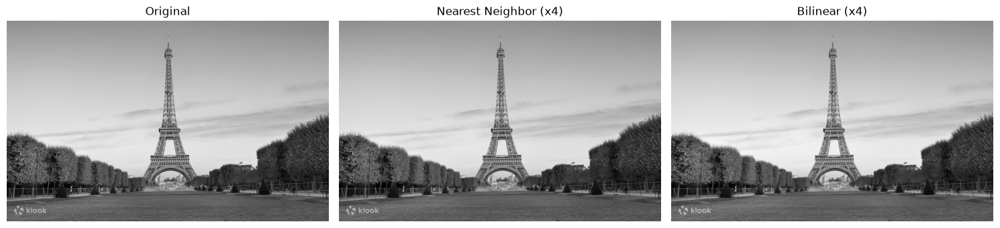

In [153]:
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.imshow(im_q8, cmap="gray")
plt.title("Original")
plt.axis("off")
plt.subplot(1, 3, 2)
plt.imshow(zoom_nearest, cmap="gray")
plt.title("Nearest Neighbor (x4)")
plt.axis("off")
plt.subplot(1, 3, 3)
plt.imshow(zoom_bilinear, cmap="gray")
plt.title("Bilinear (x4)")
plt.axis("off")
plt.tight_layout()
plt.show()

In [154]:
reconstructed_nearest = nearest_neighbor_resize(zoom_nearest,1 / s)
reconstructed_bilinear = bilinear_resize(zoom_bilinear,1 / s)

print("Original:", im_q8.shape)
print("Reconstructed nearest:", reconstructed_nearest.shape)
print("Reconstructed bilinear:", reconstructed_bilinear.shape)

Original: (469, 750)
Reconstructed nearest: (469, 750)
Reconstructed bilinear: (469, 750)


In [155]:
def normalized_ssd(original, reconstructed):
    original = original.astype(np.float32)
    reconstructed = reconstructed.astype(np.float32)
    ssd = np.sum((original - reconstructed) ** 2)
    normalization = np.sum(original ** 2)
    return ssd / normalization

nssd_nearest = normalized_ssd(im_q8,reconstructed_nearest)
nssd_bilinear = normalized_ssd(im_q8,reconstructed_bilinear)

print("Normalized SSD - Nearest Neighbor :", nssd_nearest)
print("Normalized SSD - Bilinear         :", nssd_bilinear)

Normalized SSD - Nearest Neighbor : 0.0
Normalized SSD - Bilinear         : 0.00018833716


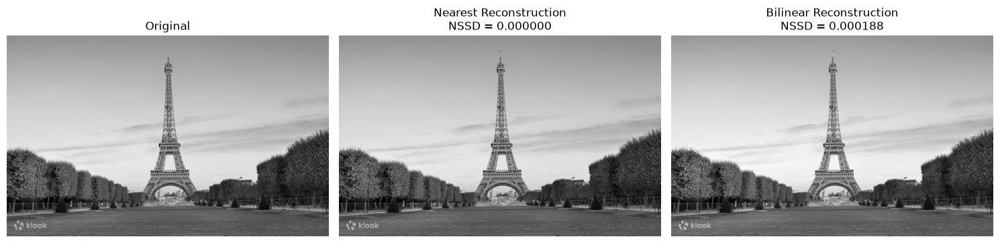

In [156]:
plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.imshow(im_q8, cmap="gray")
plt.title("Original")
plt.axis("off")
plt.subplot(1, 3, 2)
plt.imshow(reconstructed_nearest, cmap="gray")
plt.title(f"Nearest Reconstruction\nNSSD = {nssd_nearest:.6f}")
plt.axis("off")
plt.subplot(1, 3, 3)
plt.imshow(reconstructed_bilinear, cmap="gray")
plt.title(f"Bilinear Reconstruction\nNSSD = {nssd_bilinear:.6f}")
plt.axis("off")
plt.tight_layout()
plt.show()

### **Discussion**
The image was enlarged 4× using nearest-neighbor and bilinear interpolation. Nearest-neighbor gives a blocky result, while bilinear produces a smoother image. The reconstructed images were compared using normalized SSD, where the lower value indicates greater similarity to the original.

## Question 9 — GrabCut Segmentation

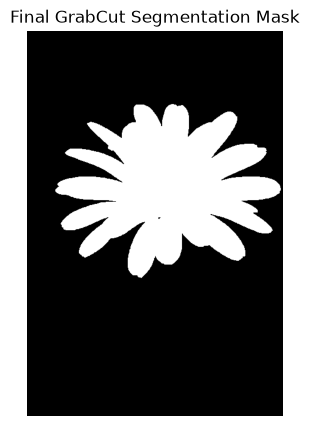

In [157]:
im_q9 = cv.imread("images/q9/fig9.png")
im_q9_rgb = cv.cvtColor(im_q9, cv.COLOR_BGR2RGB)
h, w = im_q9.shape[:2]
rect = (int(0.10 * w),int(0.02 * h),int(0.90 * w),int(0.70 * h))
mask = np.zeros((h, w), np.uint8)
bgdModel = np.zeros((1, 65), np.float64)
fgdModel = np.zeros((1, 65), np.float64)
cv.grabCut(im_q9,mask,rect,bgdModel,fgdModel,5,cv.GC_INIT_WITH_RECT)
final_mask = np.where((mask == cv.GC_FGD) | (mask == cv.GC_PR_FGD),1,0).astype(np.uint8)
plt.figure(figsize=(5, 5))
plt.imshow(final_mask, cmap="gray")
plt.axis("off")
plt.title("Final GrabCut Segmentation Mask")
plt.show()

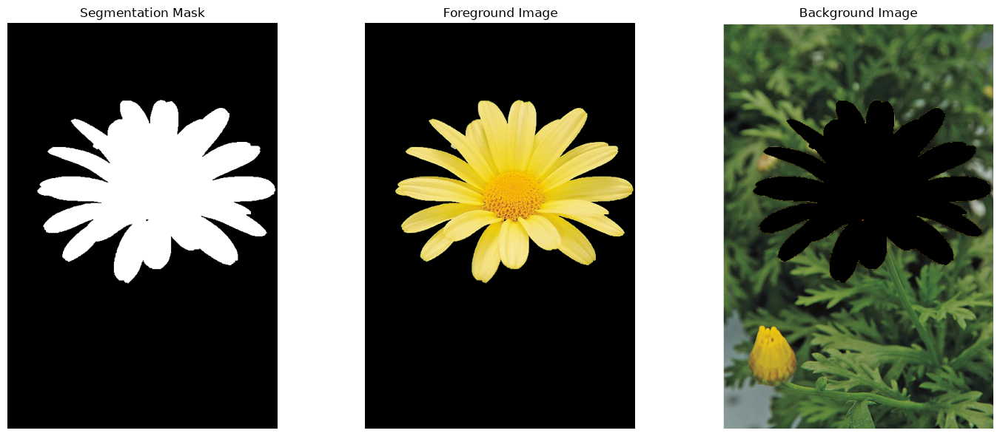

In [158]:
foreground = im_q9_rgb * final_mask[:, :, np.newaxis]
background = im_q9_rgb * (1 - final_mask[:, :, np.newaxis])
plt.figure(figsize=(15, 6))
plt.subplot(1, 3, 1)
plt.imshow(final_mask, cmap="gray")
plt.title("Segmentation Mask")
plt.axis("off")
plt.subplot(1, 3, 2)
plt.imshow(foreground)
plt.title("Foreground Image")
plt.axis("off")
plt.subplot(1, 3, 3)
plt.imshow(background)
plt.title("Background Image")
plt.axis("off")
plt.tight_layout()
plt.show()

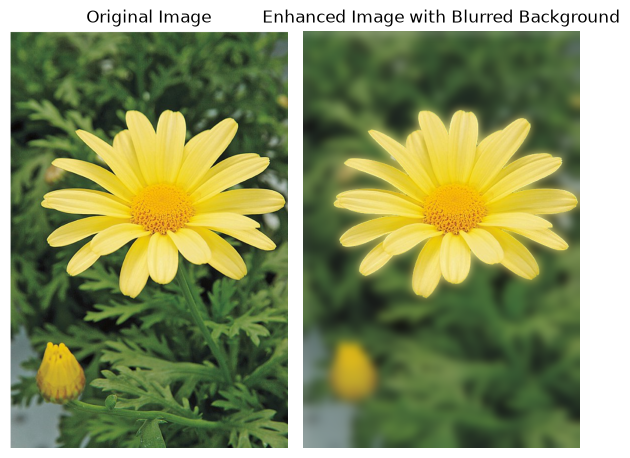

In [159]:
blurred = cv.GaussianBlur(im_q9_rgb, (51, 51), 0)
enhanced = (foreground + blurred * (1 - final_mask[:, :, np.newaxis])).astype(np.uint8)
plt.figure(figsize=(6, 6))
plt.subplot(1, 2, 1)
plt.imshow(im_q9_rgb)
plt.title("Original Image")
plt.axis("off")
plt.subplot(1, 2, 2)
plt.imshow(enhanced)
plt.title("Enhanced Image with Blurred Background")
plt.axis("off")
plt.tight_layout()
plt.show()

### **Explanation**

The dark region just beyond the flower edge is caused by the interaction between the GrabCut segmentation mask and the background processing. GrabCut produces a hard foreground/background mask, and some pixels near the flower boundary may be classified as background. During the recombination of the sharp foreground and blurred background, these boundary pixels therefore come from the background component. This can produce a dark halo or dark region immediately outside the flower edge.

## Question 10 — Bilateral Filtering

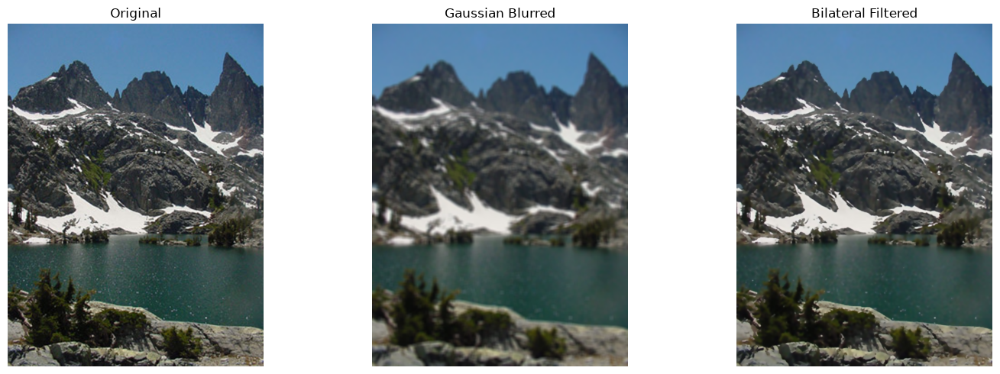

In [160]:
im_q10 = cv.imread("images/q10/fig10.png")
im_q10_rgb = cv.cvtColor(im_q10, cv.COLOR_BGR2RGB)

ksize = 9
sigma_s = 75
sigma_r = 75
gaussian_q10 = cv.GaussianBlur(im_q10,(ksize, ksize),sigma_s)
bilateral_q10 = cv.bilateralFilter(im_q10, d=ksize, sigmaColor = sigma_r, sigmaSpace = sigma_s)
gaussian_q10_rgb = cv.cvtColor(gaussian_q10, cv.COLOR_BGR2RGB)
bilateral_q10_rgb = cv.cvtColor(bilateral_q10, cv.COLOR_BGR2RGB)

plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.imshow(im_q10_rgb)
plt.title("Original")
plt.axis("off")
plt.subplot(1, 3, 2)
plt.imshow(gaussian_q10_rgb)
plt.title("Gaussian Blurred")
plt.axis("off")
plt.subplot(1, 3, 3)
plt.imshow(bilateral_q10_rgb)
plt.title("Bilateral Filtered")
plt.axis("off")

plt.tight_layout()
plt.show()

### Own Implementation of the Bilateral Filter

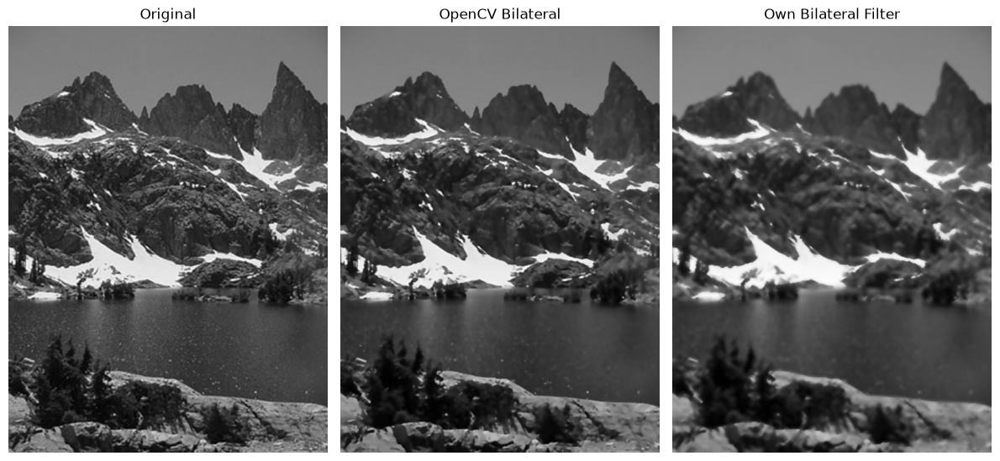

In [161]:
def bilateral_filter_gray(im, kernel_size=9, sigma_s=75, sigma_r=75):
    im = im.astype(np.float32)
    radius = kernel_size // 2
    padded = np.pad(im,((radius, radius), (radius, radius)),mode="reflect")
    output = np.zeros_like(im)
    y, x = np.mgrid[-radius:radius+1, -radius:radius+1]
    spatial_weight = np.exp( -(x**2 + y**2) / (2 * sigma_s**2))
    for i in range(im.shape[0]):
        for j in range(im.shape[1]):
            region = padded[i:i + kernel_size,j:j + kernel_size]
            centre = padded[i + radius,j + radius]
            range_weight = np.exp(-((region - centre) ** 2)/ (2 * sigma_r**2))
            weights = spatial_weight * range_weight
            output[i, j] = np.sum(weights * region) / np.sum(weights)

    return np.clip(output, 0, 255).astype(np.uint8)

gray_q10 = cv.cvtColor(im_q10, cv.COLOR_BGR2GRAY)
my_bilateral = bilateral_filter_gray(gray_q10, kernel_size=9, sigma_s=75, sigma_r=75)
opencv_bilateral_gray = cv.cvtColor(bilateral_q10, cv.COLOR_BGR2GRAY)
plt.figure(figsize=(12, 8))
plt.subplot(1, 3, 1)
plt.imshow(gray_q10, cmap="gray")
plt.title("Original")
plt.axis("off")
plt.subplot(1, 3, 2)
plt.imshow(opencv_bilateral_gray, cmap="gray")
plt.title("OpenCV Bilateral")
plt.axis("off")
plt.subplot(1, 3, 3)
plt.imshow(my_bilateral, cmap="gray")
plt.title("Own Bilateral Filter")
plt.axis("off")
plt.tight_layout()
plt.show()

In [162]:
def mse(im1, im2):
    im1 = im1.astype(np.float32)
    im2 = im2.astype(np.float32)
    return np.mean((im1 - im2) ** 2)

mse_value = mse(opencv_bilateral_gray, my_bilateral)
print("MSE between OpenCV and own bilateral filter:",mse_value)

MSE between OpenCV and own bilateral filter: 62.65253


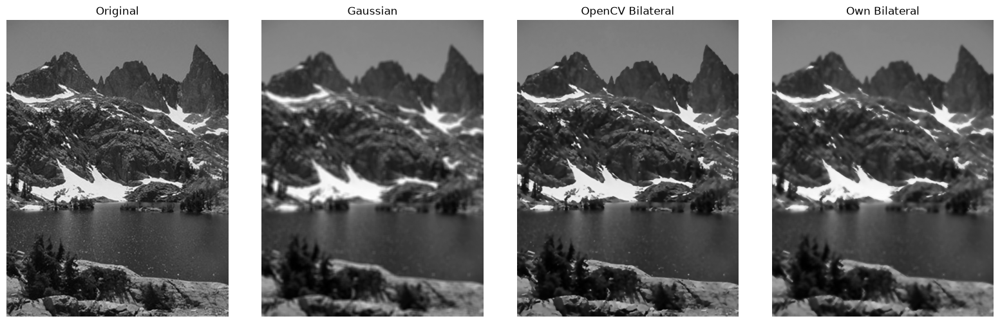

In [163]:
plt.figure(figsize=(16, 5))
plt.subplot(1, 4, 1)
plt.imshow(gray_q10, cmap="gray")
plt.title("Original")
plt.axis("off")
plt.subplot(1, 4, 2)
plt.imshow(cv.cvtColor(cv.GaussianBlur(im_q10, (9, 9), 75),cv.COLOR_BGR2GRAY),cmap="gray")
plt.title("Gaussian")
plt.axis("off")
plt.subplot(1, 4, 3)
plt.imshow(opencv_bilateral_gray, cmap="gray")
plt.title("OpenCV Bilateral")
plt.axis("off")
plt.subplot(1, 4, 4)
plt.imshow(my_bilateral, cmap="gray")
plt.title("Own Bilateral")
plt.axis("off")
plt.tight_layout()
plt.show()

### **Discussion**

The Gaussian filter smooths the image but blurs edges, while the bilateral filter provides better edge preservation by considering both spatial and intensity differences. The own implementation is compared with OpenCV’s bilateralFilter using MSE, where a lower MSE indicates better agreement.